October 10 2025

**Data provenance**

The dataset includes microstructural images collected from (i) a Ti–6Al–4V (Ti64) alloy sample, and (ii) Nb alloy. The images were acquired using optical/Laser microscopy



**What you’ll find here**

Raw metallographic/SEM images of alloy microstructures.

Baseline segmentation examples (e.g., k-means, thresholding) to illustrate challenges such as streak artifacts or misclassification.

**What you will do**

**Apply segmentation methods**  and record your observations.

**Compare techniques** and comment on their strengths and limitations.

**Visualize results** by overlaying predicted features or segmentation masks onto the original images.

# Importing data

In [2]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import numpy as np
from PIL import Image
from sklearn.cluster import KMeans

## Two Sets of Images

*   Ti64
*   Nb Alloy



In [3]:
!gdown --fuzzy https://drive.google.com/file/d/1cS4aWLKAhwiXSHz23Yb8FEvyBFOO_U4C/view?usp=sharing
!gdown --fuzzy https://drive.google.com/file/d/1H4GwZYJyhDVoFPfA1_cT_8xQNvcAmuk1/view?usp=sharing



Downloading...
From: https://drive.google.com/uc?id=1cS4aWLKAhwiXSHz23Yb8FEvyBFOO_U4C
To: /content/Ti64.png
100% 997k/997k [00:00<00:00, 103MB/s]
Downloading...
From: https://drive.google.com/uc?id=1H4GwZYJyhDVoFPfA1_cT_8xQNvcAmuk1
To: /content/MultiPhase_w_Dislocations.tif
100% 1.88M/1.88M [00:00<00:00, 197MB/s]


# 1.Ti64

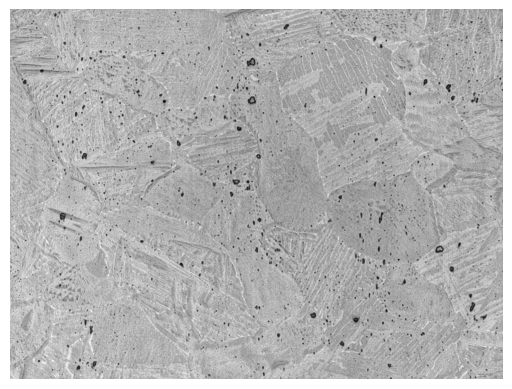

In [3]:
img1 = mpimg.imread("Ti64.png")
plt.imshow(img1)
plt.axis("off")
plt.show()


**What you see in the image**

The grayscale image above is a microscopy snapshot of Ti–6Al–4V (Ti64), a widely used aerospace alloy. Its internal structure has two major building blocks:

1.   α phase (alpha, light regions): Appears as the lighter gray regions. The α phase is stable at room temperature and gives the alloy strength.
2.   β phase (beta, darker regions): Seen as the darker intergranular regions. The β phase provides ductility (ability to bend/stretch).
3.   The small black spots visible across the sample are not another phase but likely surface dirt or minor preparation artifacts, not intrinsic features of the material.

**Why this matters**


Being able to classify which pixel belongs to α or β is the first step that lays the foundation for all subsequent characterization.

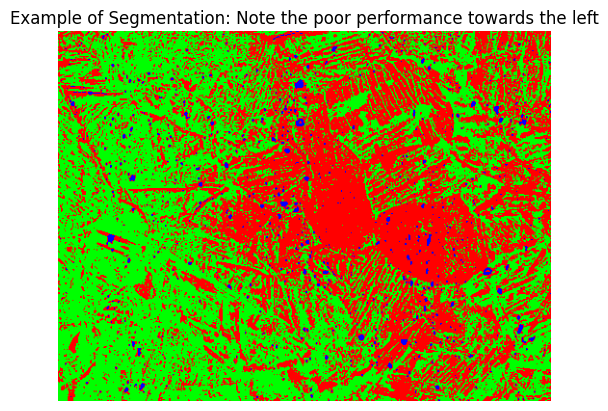

## Your Turn

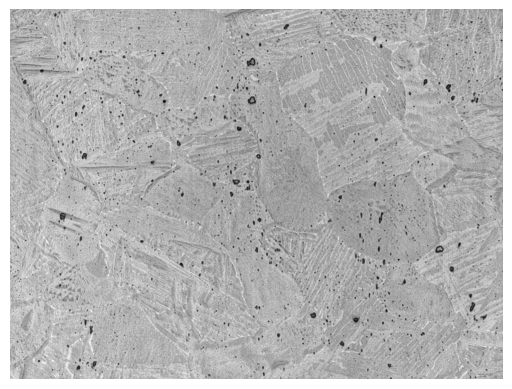

In [4]:
# image saved as img1
plt.imshow(img1)
plt.axis("off")
plt.show()

In [6]:
img1.shape

(768, 1024, 3)

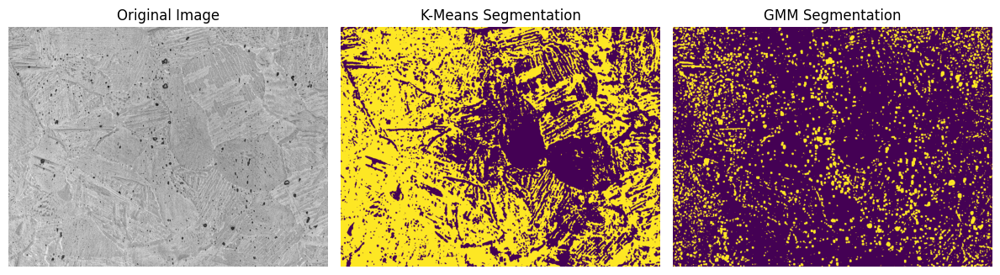

In [10]:
from sklearn.mixture import GaussianMixture

# Function to extract patches using sliding window
def extract_patches(image, patch_size, step):
    patches = []
    for i in range(0, image.shape[0] - patch_size + 1, step):
        for j in range(0, image.shape[1] - patch_size + 1, step):
            patch = image[i:i+patch_size, j:j+patch_size]
            patches.append(patch.flatten())
    return np.array(patches)

# Define patch size and step for sliding window
patch_size = 5
step = 1

# Extract patches from img1
patches = extract_patches(img1, patch_size, step)

# Apply K-Means clustering
n_clusters_kmeans = 2  # Assuming 2 phases (alpha and beta)
kmeans = KMeans(n_clusters=n_clusters_kmeans, random_state=42, n_init=10)
kmeans_labels = kmeans.fit_predict(patches)

# Apply GMM clustering
n_components_gmm = 2 # Assuming 2 phases (alpha and beta)
gmm = GaussianMixture(n_components=n_components_gmm, random_state=42)
gmm_labels = gmm.fit_predict(patches)

# Reshape labels back to image dimensions (approximately)
# This is a simplification; a more accurate approach would map patch centers to pixels
img_height, img_width = img1.shape[:2]
# Calculate the approximate number of patches in each dimension
num_patches_h = (img_height - patch_size) // step + 1
num_patches_w = (img_width - patch_size) // step + 1

kmeans_segmented_img = np.zeros((num_patches_h, num_patches_w))
gmm_segmented_img = np.zeros((num_patches_h, num_patches_w))

patch_index = 0
for i in range(num_patches_h):
    for j in range(num_patches_w):
        kmeans_segmented_img[i, j] = kmeans_labels[patch_index]
        gmm_segmented_img[i, j] = gmm_labels[patch_index]
        patch_index += 1

# Visualize the results
plt.figure(figsize=(12, 6))

plt.subplot(1, 3, 1)
plt.imshow(img1, cmap='gray')
plt.title("Original Image")
plt.axis("off")

plt.subplot(1, 3, 2)
plt.imshow(kmeans_segmented_img, cmap='viridis')
plt.title("K-Means Segmentation")
plt.axis("off")

plt.subplot(1, 3, 3)
plt.imshow(gmm_segmented_img, cmap='viridis')
plt.title("GMM Segmentation")
plt.axis("off")

plt.tight_layout()
plt.show()

# 2.Niobium alloy showing phases, dislocations, and cracks

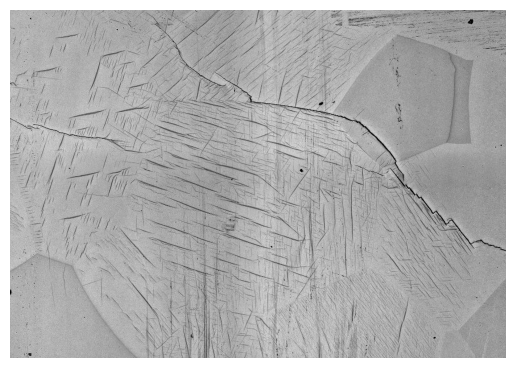

In [4]:
img2 = mpimg.imread("MultiPhase_w_Dislocations.tif")
plt.imshow(img2)
plt.axis("off")
plt.show()

This image shows a niobium (Nb) based alloy containing multiple phases and visible defects/dislocations.

**Phases:**

Nb alloys typically contain distinct crystalline regions (phases). Each phase has different contrast in the image because they scatter or absorb light/electrons differently.



*   **Phase A**: Different Grains
*   **Phase B (darker)**: Secondary precipitates or solute-rich regions showing as small cracks








**Artifacts**

* **Black spots:** Defects
* **Polishing artifact**: Visible on the top right of the image


**Deformation Features**

* **Cracking:** Two distinct cracks propagating through the microstructure.


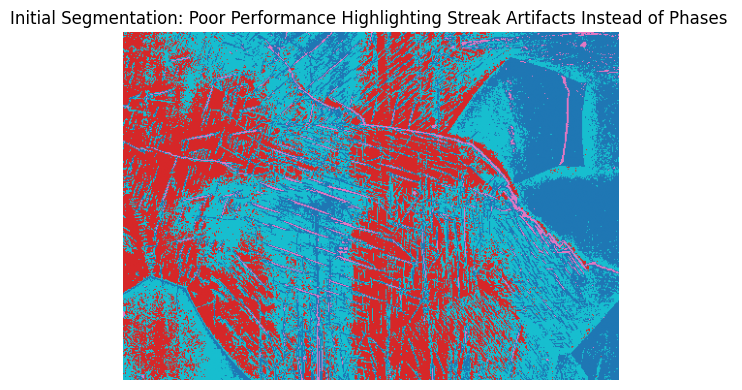

## Your turn

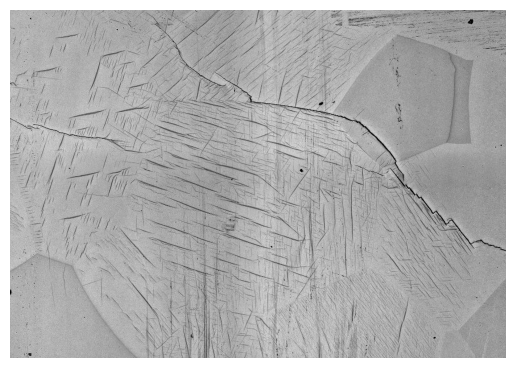

In [5]:
# image saved as img2
plt.imshow(img2)
plt.axis("off")
plt.show()

Let's try normalizing each patch so that we do not get the different intensities when clustering using K-means

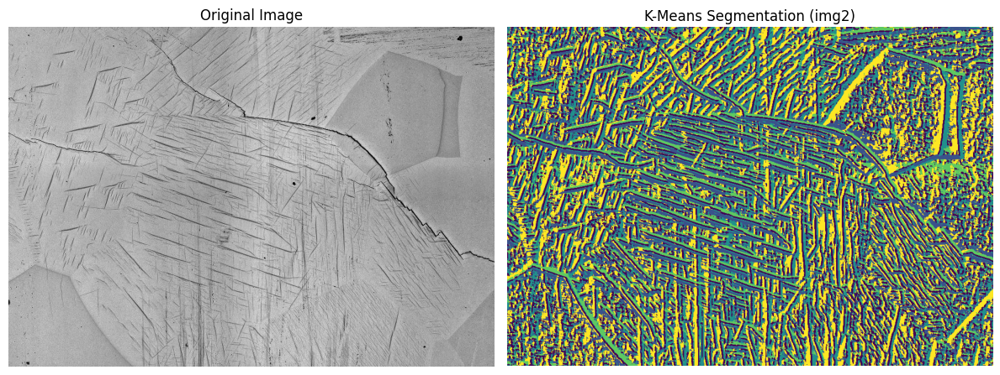

In [16]:
# img2 is already loaded
# img2 = mpimg.imread("MultiPhase_w_Dislocations.tif")

# Function to extract patches using sliding window and normalize
def extract_patches_and_normalize(image, patch_size, step):
    patches = []
    for i in range(0, image.shape[0] - patch_size + 1, step):
        for j in range(0, image.shape[1] - patch_size + 1, step):
            patch = image[i:i+patch_size, j:j+patch_size].flatten()
            # Normalize the patch
            patch = (patch - np.mean(patch)) / (np.std(patch) + 1e-6) # Add small epsilon to avoid division by zero
            patches.append(patch)
    return np.array(patches)

# Define patch size and step for sliding window
patch_size = 10
step = 1

# Extract patches from img2 and normalize
patches2 = extract_patches_and_normalize(img2, patch_size, step)

# Apply K-Means clustering
n_clusters_kmeans2 = 5  # Assuming multiple phases and features
kmeans2 = KMeans(n_clusters=n_clusters_kmeans2, random_state=42, n_init=10)
kmeans_labels2 = kmeans2.fit_predict(patches2)

# Reshape labels back to image dimensions (approximately)
img_height2, img_width2 = img2.shape[:2]
num_patches_h2 = (img_height2 - patch_size) // step + 1
num_patches_w2 = (img_width2 - patch_size) // step + 1

kmeans_segmented_img2 = np.zeros((num_patches_h2, num_patches_w2))

patch_index2 = 0
for i in range(num_patches_h2):
    for j in range(num_patches_w2):
        kmeans_segmented_img2[i, j] = kmeans_labels2[patch_index2]
        patch_index2 += 1

# Visualize the results
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.imshow(img2, cmap='gray')
plt.title("Original Image")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(kmeans_segmented_img2, cmap='viridis')
plt.title("K-Means Segmentation (img2)")
plt.axis("off")

plt.tight_layout()
plt.show()

Looks like the normalization made the scratches, cracks and precipitate lines look like the same

#Flattening
Lets flatten the image to remove the reflection and not normalize patch wise so that we can try to differentiate cracks and ppts

In [77]:
import cv2, numpy as np

# img = cv2.imread("your_image.png", cv2.IMREAD_GRAYSCALE).astype(np.float32)

# large blur ≈ illumination field (tune sigma depending on streak width)
illum = cv2.GaussianBlur(img2, (0,0), sigmaX=20, sigmaY=150)

# division (Retinex-like) keeps contrast while flattening shading
eps = 1e-6
flat = (img2 / (illum + eps)) * np.median(illum)  # keep global scale
flat = np.clip(flat, 0, 255).astype(np.uint8)


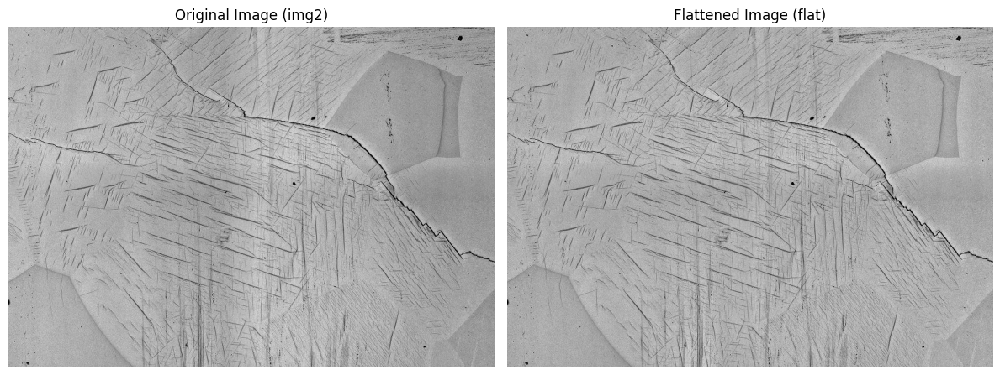

In [78]:
import matplotlib.pyplot as plt

# Assuming img2 and flat are already defined

plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.imshow(img2, cmap='gray')
plt.title("Original Image (img2)")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(flat, cmap='gray')
plt.title("Flattened Image (flat)")
plt.axis("off")

plt.tight_layout()
plt.show()

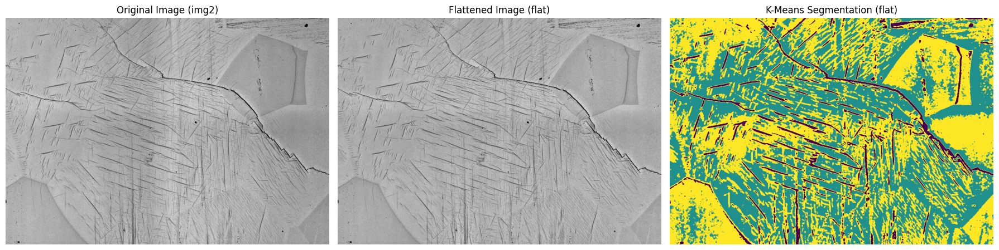

In [80]:
# img2 and flat are already loaded/created

# Function to extract patches using sliding window
def extract_patches(image, patch_size, step):
    patches = []
    for i in range(0, image.shape[0] - patch_size + 1, step):
        for j in range(0, image.shape[1] - patch_size + 1, step):
            patch = image[i:i+patch_size, j:j+patch_size]
            patches.append(patch.flatten())
    return np.array(patches)

# Define patch size and step for sliding window
patch_size = 5
step = 1

# Extract patches from flat
patches_flat = extract_patches(flat, patch_size, step)

# Apply K-Means clustering
n_clusters_kmeans_flat = 3  # Adjust number of clusters as needed
kmeans_flat = KMeans(n_clusters=n_clusters_kmeans_flat, random_state=42, n_init=10)
kmeans_labels_flat = kmeans_flat.fit_predict(patches_flat)

# Reshape labels back to image dimensions (approximately)
img_height_flat, img_width_flat = flat.shape[:2]
num_patches_h_flat = (img_height_flat - patch_size) // step + 1
num_patches_w_flat = (img_width_flat - patch_size) // step + 1

kmeans_segmented_img_flat = np.zeros((num_patches_h_flat, num_patches_w_flat))

patch_index_flat = 0
for i in range(num_patches_h_flat):
    for j in range(num_patches_w_flat):
        kmeans_segmented_img_flat[i, j] = kmeans_labels_flat[patch_index_flat]
        patch_index_flat += 1

# Visualize the results
plt.figure(figsize=(18, 6))

plt.subplot(1, 3, 1)
plt.imshow(img2, cmap='gray')
plt.title("Original Image (img2)")
plt.axis("off")

plt.subplot(1, 3, 2)
plt.imshow(flat, cmap='gray')
plt.title("Flattened Image (flat)")
plt.axis("off")

plt.subplot(1, 3, 3)
plt.imshow(kmeans_segmented_img_flat, cmap='viridis')
plt.title("K-Means Segmentation (flat)")
plt.axis("off")

plt.tight_layout()
plt.show()

# Feature Based K-means

We include flating that worked before, but define some features(precipitates, scratches, cracks)  and run K-means

In [6]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from scipy.ndimage import gaussian_filter
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from skimage.filters import sobel, frangi, meijering, gabor
from skimage.feature import local_binary_pattern


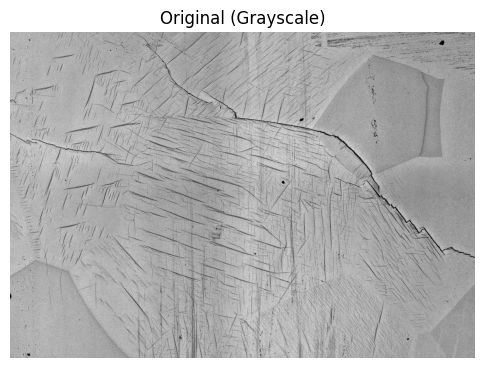

In [14]:
img_raw = img2

# Convert to grayscale if needed
if img_raw.ndim == 3:
    img = cv2.cvtColor(img_raw, cv2.COLOR_BGR2GRAY).astype(np.float32)
else:
    img = img_raw.astype(np.float32)

plt.figure(figsize=(6,6))
plt.imshow(img, cmap='gray')
plt.title("Original (Grayscale)")
plt.axis('off')
plt.show()

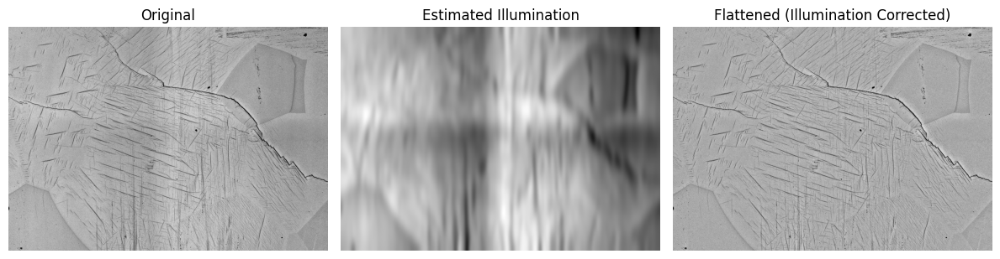

In [72]:
# 2️⃣ Remove uneven illumination (e.g., reflection streaks)

# Estimate illumination by strong Gaussian blur
illum = cv2.GaussianBlur(img, (0, 0), sigmaX=5, sigmaY=20)
eps = 1e-6
flat = (img / (illum + eps)) * np.median(illum)
flat = np.clip(flat, 0, 255).astype(np.uint8)

I = flat.astype(np.float32) / 255.0  # normalized grayscale

# Visualize the correction
plt.figure(figsize=(12,4))
plt.subplot(1,3,1); plt.imshow(img, cmap='gray'); plt.title("Original"); plt.axis('off')
plt.subplot(1,3,2); plt.imshow(illum, cmap='gray'); plt.title("Estimated Illumination"); plt.axis('off')
plt.subplot(1,3,3); plt.imshow(I, cmap='gray'); plt.title("Flattened (Illumination Corrected)"); plt.axis('off')
plt.tight_layout(); plt.show()


In [73]:
# === Lean feature set ===
from scipy.ndimage import gaussian_filter
from skimage.filters import sobel, frangi, gaussian
from skimage.morphology import black_tophat, white_tophat, disk
from skimage.feature import structure_tensor
import numpy as np

F = []

# 1) intensity + local mean
F.append(I)
mu = gaussian_filter(I, 9)
F.append(mu)

# 2) dark thin features
fr_dark = frangi(I, sigmas=(1,2,3), black_ridges=True, alpha=0.5, beta=0.5, gamma=15)
F.append(fr_dark)
bt3 = black_tophat(I, disk(3))
bt7 = black_tophat(I, disk(7))
F += [bt3, bt7]

# 3) grain boundaries (coarse)
I_coarse = gaussian(I, 2.0)
grad_coarse = sobel(I_coarse)
F.append(grad_coarse)

# coherence from structure tensor
Axx, Axy, Ayy = structure_tensor(I, sigma=2)
tmp = np.sqrt((Axx - Ayy)**2 + 4*Axy**2)
l1s = 0.5 * (Axx + Ayy + tmp)
l2s = 0.5 * (Axx + Ayy - tmp)
coherence = (l1s - l2s) / (l1s + l2s + 1e-6)
F.append(coherence)

# 4) (optional) bright scratches
use_bright = True
if use_bright:
    fr_bright = frangi(I, sigmas=(1,2,3), black_ridges=False, alpha=0.5, beta=0.5, gamma=15)
    wt3 = white_tophat(I, disk(3))
    F += [fr_bright, wt3]

# stack → scale → kmeans
X = np.stack(F, axis=-1).astype(np.float32)
H, W, D = X.shape


---

#### **1️⃣ Intensity Context**

| Feature                   | Description                           | Purpose                                                                           |
| ------------------------- | ------------------------------------- | --------------------------------------------------------------------------------- |
| **`I`**                   | Illumination-corrected intensity      | Preserves true dark/bright polarity (so cracks stay dark, scratches stay bright). |
| **`μ` (local mean, σ≈9)** | Smoothed brightness around each pixel | Provides context and reduces influence of uneven lighting or reflections.         |

---

#### **2️⃣ Dark Thin Features (Precipitates + Crack)**

| Feature                          | Description                                                                | Purpose                                                                    |
| -------------------------------- | -------------------------------------------------------------------------- | -------------------------------------------------------------------------- |
| **Frangi (`black_ridges=True`)** | Multiscale dark-ridge detector                                             | Captures elongated dark lines such as cracks and dark precipitate streaks. |
| **Black Top-Hat (r=3)**          | Morphological filter removing local background (small structuring element) | Highlights small, dark blobs — fine precipitates.                          |
| **Black Top-Hat (r=7)**          | Same as above with larger radius                                           | Enhances medium-scale dark ridges, such as the main crack.                 |

---

#### **3️⃣ Grain Boundaries (Broad Edges)**

| Feature                        | Description                                            | Purpose                                                                               |
| ------------------------------ | ------------------------------------------------------ | ------------------------------------------------------------------------------------- |
| **Coarse Gradient Magnitude**  | Sobel edge strength computed after Gaussian blur (σ≈2) | Emphasizes wide, low-frequency edges corresponding to grain boundaries.               |
| **Structure-Tensor Coherence** | ((λ₁−λ₂)/(λ₁+λ₂)), ratio of tensor eigenvalues         | Measures local orientation consistency — high for long, smooth boundaries and cracks. |





In [74]:
# 4️⃣ Standardize feature channels and run K-Means clustering

X2 = X.reshape(-1, D)
scaler = StandardScaler().fit(X2)
Xz = scaler.transform(X2)

k = 8 # 🔸 Try values between 5–8
print("Running K-Means...")

kmeans = KMeans(n_clusters=k, n_init=20, random_state=42)
labels = kmeans.fit_predict(Xz)
labels_img = labels.reshape(H, W)


Running K-Means...


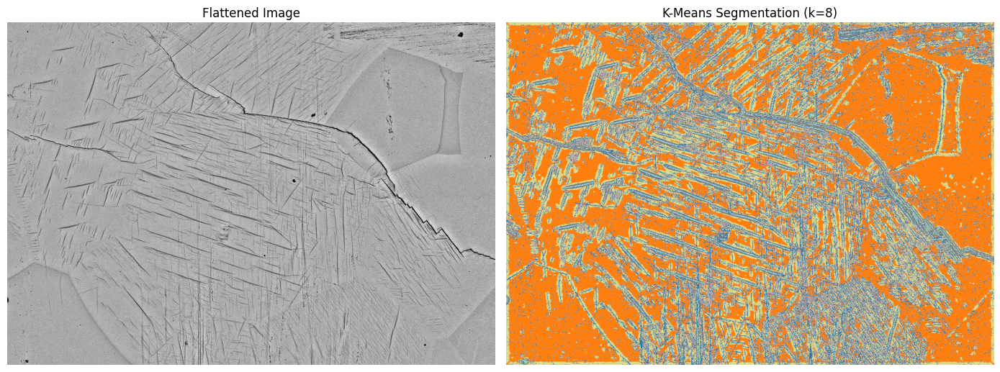

In [75]:
# 5️⃣ Visualize segmentation result

fig, ax = plt.subplots(1, 2, figsize=(14, 6))
ax[0].imshow(I, cmap='gray')
ax[0].set_title('Flattened Image')
ax[1].imshow(labels_img, cmap='tab20')
ax[1].set_title(f'K-Means Segmentation (k={k})')

for a in ax: a.axis('off')
plt.tight_layout()
plt.show()


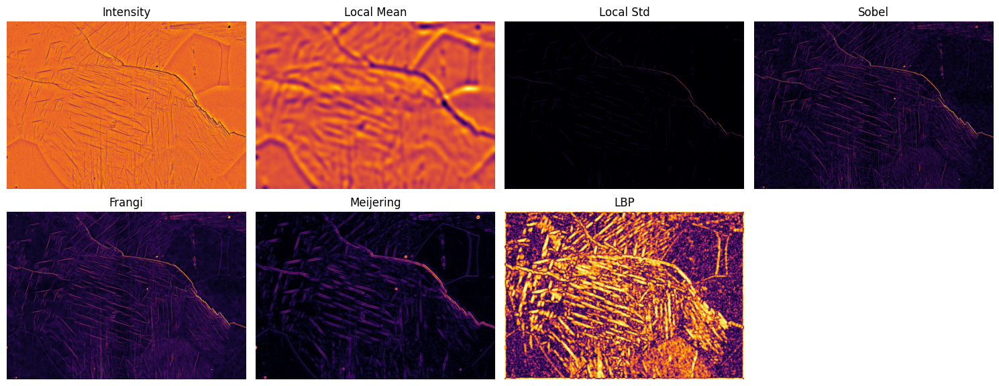

In [76]:
# 6️⃣ (Optional) Visualize a few feature maps to understand what they capture

titles = ["Intensity", "Local Mean", "Local Std", "Sobel", "Frangi", "Meijering", "LBP"]
n_show = min(len(titles), len(F))

plt.figure(figsize=(15,6))
for i in range(n_show):
    plt.subplot(2, 4, i+1)
    plt.imshow(F[i], cmap='inferno')
    plt.title(titles[i])
    plt.axis('off')
plt.tight_layout()
plt.show()
